# Perform an analysis of audio meeting notes using Azure Open AI in conjunction with Azure Speech Services.

We are planning to examine a recorded voice meeting note:

1. We'll use **Azure Speech to Text** to transcribe the audio file containing your meeting notes.
2. Subsequently, we'll utilize various **Azure Open AI** functions to derive valuable insights from the transcription.
3. All the outcomes will be documented in a .docx file.
4. Lastly, we'll create a new audio file incorporating the gathered insights via **Azure Text to Speech**.

In [1]:
#%pip install python-docx
#%pip install azure-cognitiveservices-speech

In [2]:
import azure.cognitiveservices.speech as speechsdk
import json
import librosa
import matplotlib.pyplot as plt
import numpy as np
import openai
import pytz
import random
import requests
import sys
import time
import urllib
import wave

from azure.cognitiveservices.speech.audio import AudioOutputConfig
from azure.cognitiveservices.speech import (AudioDataStream,
                                            SpeechConfig,
                                            SpeechSynthesizer,
                                            SpeechSynthesisOutputFormat)
from datetime import datetime
from docx import Document
from dotenv import load_dotenv
from IPython.display import Audio
from pydub import AudioSegment
from wordcloud import (WordCloud, STOPWORDS)
from zipfile import ZipFile

In [3]:
load_dotenv("azure.env")

# Azure Open AI
openai.api_type: str = "azure"
openai.api_key = os.getenv("OPENAI_API_KEY")
openai.api_base = os.getenv("OPENAI_API_BASE")
openai.api_version = os.getenv("OPENAI_API_VERSION")

# Azure Speech services
azure_speech_key = os.getenv("AZURE_SPEECH_KEY")
azure_service_region = os.getenv("AZURE_SPEECH_REGION")

In [4]:
print('Open AI version:', openai.__version__)

Open AI version: 0.28.0


In [5]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

## 1. Functions

In [6]:
def get_audio_duration(audiofile):
    """
    Get audio duration
    """
    try:
        with wave.open(audiofile, "rb") as audio_file:
            num_frames = audio_file.getnframes()
            frame_rate = audio_file.getframerate()
            duration_seconds = num_frames / float(frame_rate)

        minutes = int(duration_seconds // 60)
        seconds = round(duration_seconds % 60, 2)
        
        if minutes > 0:
            result = f"{minutes} minute(s) and {seconds} seconds"
        else:
            result = f"{seconds} seconds"

        print(f"Duration of {audiofile} = {result}")

    except FileNotFoundError:
        print(f"File not found: {audiofile}")
    except Exception as e:
        print(f"An error occurred: {str(e)}")

In [7]:
def display_amplitude(audiofile):
    """
    Get amplitude plot from a local audio file
    """
    plt.figure(figsize=(15, 5))
    # Reading the sound file
    y, sr = librosa.load(audiofile)
    # amplitude plot
    librosa.display.waveshow(y, sr=sr)
    title = "Waveplot: " + audiofile
    plt.title(title, fontdict=dict(size=15))
    plt.xlabel("Time", fontdict=dict(size=12))
    plt.ylabel("Amplitude", fontdict=dict(size=12))

    plt.show()

In [8]:
def display_fft(audiofile):
    """
    Get FFT plot from a local audio file
    """
    plt.figure(figsize=(15, 5))

    # Reading the audio file
    y, sr = librosa.load(audiofile)
    # Creating a Discrete-Fourier Transform with our FFT algorithm
    fast_fourier_transf = np.fft.fft(y)
    # Magnitudes indicate the contribution of each frequency
    magnitude = np.abs(fast_fourier_transf)
    # mapping the magnitude to the relative frequency bins
    frequency = np.linspace(0, sr, len(magnitude))
    # We only need the first half of the magnitude and frequency
    left_mag = magnitude[: int(len(magnitude) / 2)]
    left_freq = frequency[: int(len(frequency) / 2)]

    title = "Discrete-Fourier Transform: " + audiofile
    plt.plot(left_freq, left_mag)
    plt.title(title, fontdict=dict(size=15))
    plt.xlabel("Frequency", fontdict=dict(size=12))
    plt.ylabel("Magnitude", fontdict=dict(size=12))

    plt.show()

In [9]:
def display_mel_spectogram(audiofile, n_fft=1024, hop_length=512):
    """
    Get MEL spectogram from a local audio file
    """
    plt.figure(figsize=(15, 5))

    # n_fft: this is the number of samples in a window per fft
    # hop_length: The amount of samples we are shifting after each fft

    # reading audio file
    y, sr = librosa.load(audiofile)
    # mel spectogram
    mel_signal = librosa.feature.melspectrogram(
        y=y, sr=sr, hop_length=hop_length, n_fft=n_fft
    )
    spectrogram = np.abs(mel_signal)
    power_to_db = librosa.power_to_db(spectrogram, ref=np.max)
    librosa.display.specshow(
        power_to_db,
        sr=sr,
        x_axis="time",
        y_axis="mel",
        cmap="magma",
        hop_length=hop_length,
    )

    title = "Mel-Spectogram (dB): " + audiofile
    plt.title(title, fontdict=dict(size=15))
    plt.xlabel("Time", fontdict=dict(size=12))
    plt.ylabel("Frequency", fontdict=dict(size=12))
    plt.colorbar(label="dB")

    plt.show()

In [10]:
def display_chromagram(audiofile):
    """
    Get chromagram from a local audio file
    """
    plt.figure(figsize=(15, 5))

    # reading audio file
    y, sr = librosa.load(audiofile)
    # Chromagram
    chromagram = librosa.feature.chroma_stft(y=y, sr=sr)
    librosa.display.specshow(chromagram, x_axis="time", y_axis="chroma", cmap="magma")
    plt.colorbar(format="%+2.0f dB")
    title = "Chromagram: " + audiofile
    plt.title(title)
    plt.show()

## 2. Analysing audio file

In [11]:
print("Downloading the zip audio file...")

zip_url = "https://github.com/retkowsky/Azure-OpenAI-demos/raw/main/Analyse%20audio%20meeting%20notes%20with%20Azure%20Open%20AI%20and%20Azure%20Speech%20Services/myvocalnotes.zip"
zip_file = 'myvocalnotes.zip'
urllib.request.urlretrieve(zip_url, filename=zip_file)

print("Done")

Done


In [12]:
with ZipFile(zip_file, 'r') as zip:
    print('Unzipping the file...')
    zip.extractall()
    print("Done")

Unzipping the file...
Done


In [13]:
print("Deleting the zip file...")
os.remove(zip_file)
print("Done")

Deleting the zip file...
Done


In [14]:
audiofile = "myvocalnotes.wav"

In [15]:
!ls $audiofile -lh

-rwxrwxrwx 1 root root 49M Sep 11 13:24 myvocalnotes.wav


### Listening to the first 10 seconds of the audio file

In [16]:
first_10_seconds = AudioSegment.from_wav(audiofile)[:10000]
first_10_seconds.export("sample.wav", format="wav")

Audio("sample.wav", autoplay=False)

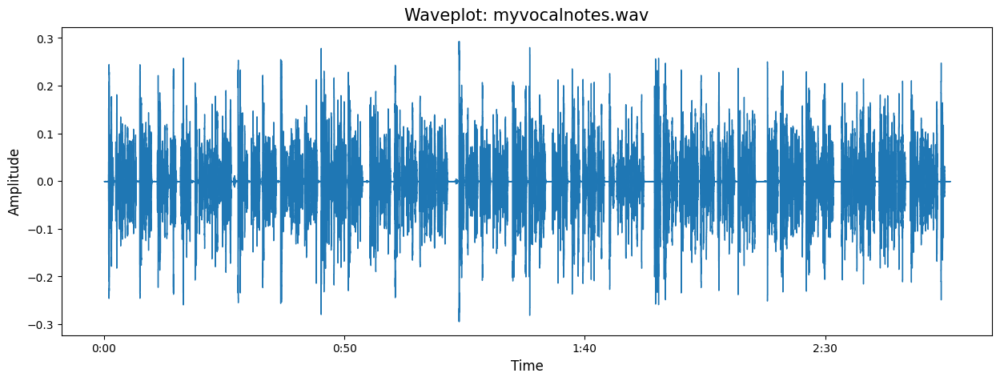

In [17]:
display_amplitude(audiofile)

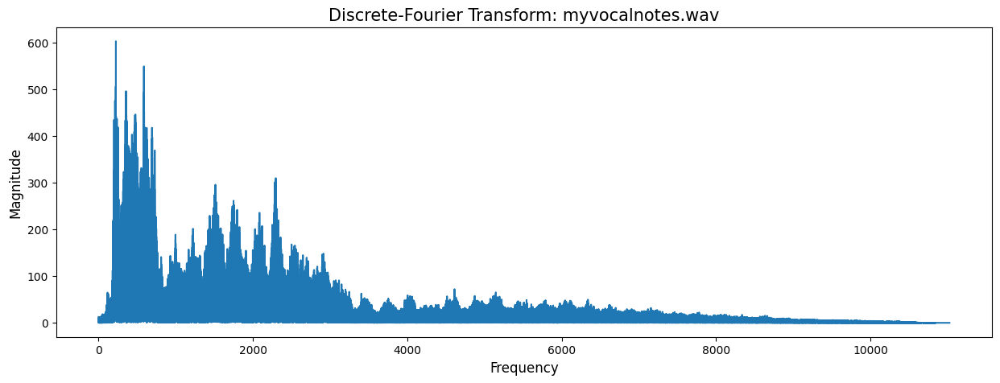

In [18]:
display_fft(audiofile)

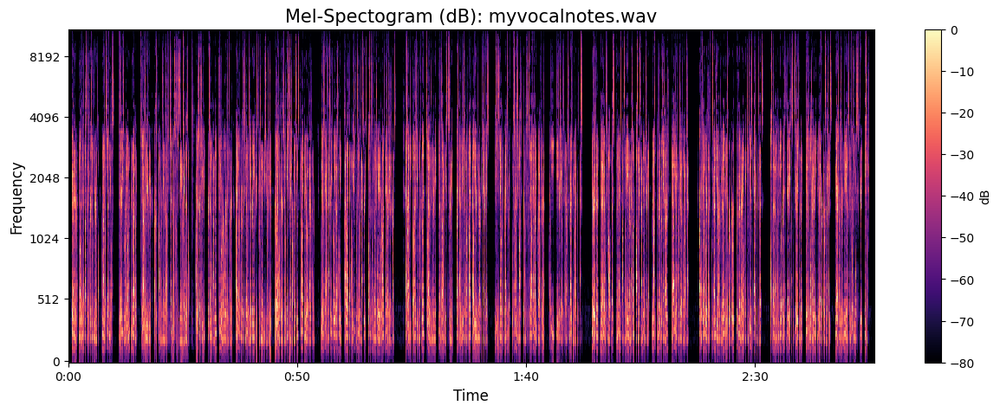

In [19]:
display_mel_spectogram(audiofile, n_fft=1024, hop_length=512)

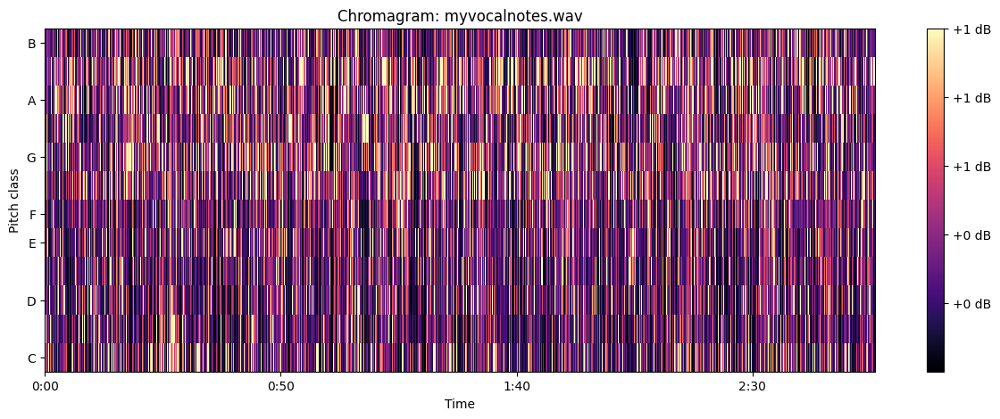

In [20]:
display_chromagram(audiofile)

## 3. Azure Speech services for Speech to Text

In [21]:
def azure_speech_to_text(audio_filepath, locale):
    """
    Azure Speech to text
    """
    print("Running the speech to text...")
    
    audio_config = speechsdk.audio.AudioConfig(filename=audio_filepath)
    speech_config = speechsdk.SpeechConfig(
        subscription=azure_speech_key, region=azure_service_region
    )
    speech_config.request_word_level_timestamps()
    speech_config.speech_recognition_language = locale
    speech_config.output_format = speechsdk.OutputFormat(1)

    # Creates a recognizer with the given settings
    speech_recognizer = speechsdk.SpeechRecognizer(
        speech_config=speech_config, audio_config=audio_config
    )

    # Variable to monitor status
    done = False

    # Service callback for recognition text
    transcript_display_list = []
    transcript_ITN_list = []
    confidence_list = []
    words = []

    def parse_azure_result(evt):
        import json

        response = json.loads(evt.result.json)
        transcript_display_list.append(response["DisplayText"])
        confidence_list_temp = [item.get("Confidence") for item in response["NBest"]]
        max_confidence_index = confidence_list_temp.index(max(confidence_list_temp))
        confidence_list.append(response["NBest"][max_confidence_index]["Confidence"])
        transcript_ITN_list.append(response["NBest"][max_confidence_index]["ITN"])
        words.extend(response["NBest"][max_confidence_index]["Words"])

    # Service callback that stops continuous recognition upon receiving an event `evt`
    def stop_cb(evt):
        print("CLOSING on {}".format(evt))
        speech_recognizer.stop_continuous_recognition()
        nonlocal done
        done = True

        # Do something with the combined responses
        print(transcript_display_list)
        print(confidence_list)
        print(words)

    # Connect callbacks to the events fired by the speech recognizer
    speech_recognizer.recognizing.connect(
        lambda evt: logger.debug("RECOGNIZING: {}".format(evt))
    )
    speech_recognizer.recognized.connect(parse_azure_result)
    speech_recognizer.session_started.connect(
        lambda evt: logger.debug("SESSION STARTED: {}".format(evt))
    )
    speech_recognizer.session_stopped.connect(
        lambda evt: logger.debug("SESSION STOPPED {}".format(evt))
    )
    speech_recognizer.canceled.connect(
        lambda evt: logger.debug("CANCELED {}".format(evt))
    )
    # stop continuous recognition on either session stopped or canceled events
    speech_recognizer.session_stopped.connect(stop_cb)
    speech_recognizer.canceled.connect(stop_cb)

    # Start continuous speech recognition
    speech_recognizer.start_continuous_recognition()
    while not done:
        time.sleep(0.5)

    print("Done")
    return transcript_display_list, confidence_list, words

In [22]:
locale = "en-US"

> https://learn.microsoft.com/en-us/azure/ai-services/speech-service/language-support?tabs=stt

In [23]:
transcript, confidence, words = azure_speech_to_text(audiofile, locale)

Running the speech to text...
CLOSING on SpeechRecognitionCanceledEventArgs(session_id=31d98b5bb4c54b7fa119b7408fe1a164, result=SpeechRecognitionResult(result_id=0c7f79716f31472ea1026d99ed6e848b, text="", reason=ResultReason.Canceled))
["Good afternoon, everyone, and welcome to Fintech Plus Sync second quarter 2023 earnings call. I'm John Doe, CEO of Fintech Plus.", "We've had a stellar Q2 with a revenue of 125 million.", 'A 25% increase year over year.', 'Our gross profit margin stands at a solid 58% due in part to cost efficiencies gained from our scalable business model.', 'Are you Betas surged to three 37.5 million translating to a remarkable 30% EBITDA margin?', 'Our net income for the quarter rose to 16,000,000 which is a noteworthy increase from 10 million in Q 2/20/22. Our total addressable market has grown substantially thanks to the expansion of our high yield savings product line and the new Robo advisor platform.', "We've been diversifying our asset backed securities portfo

### Transcript

In [24]:
mynotes = ' '.join(transcript)

with open("wav_transcript.txt", 'w') as file:
    file.write(mynotes)

In [25]:
mynotes

"Good afternoon, everyone, and welcome to Fintech Plus Sync second quarter 2023 earnings call. I'm John Doe, CEO of Fintech Plus. We've had a stellar Q2 with a revenue of 125 million. A 25% increase year over year. Our gross profit margin stands at a solid 58% due in part to cost efficiencies gained from our scalable business model. Are you Betas surged to three 37.5 million translating to a remarkable 30% EBITDA margin? Our net income for the quarter rose to 16,000,000 which is a noteworthy increase from 10 million in Q 2/20/22. Our total addressable market has grown substantially thanks to the expansion of our high yield savings product line and the new Robo advisor platform. We've been diversifying our asset backed securities portfolio, investing heavily in collateralized debt obligations and residential mortgage-backed securities. We've also invested 25,000,000 in AAA rated corporate bonds, enhancing our risk adjusted returns. As for a balance sheet, total assets reached 1.5 billio

In [26]:
!ls wav_transcript.txt -lh

-rwxrwxrwx 1 root root 2.2K Sep 11 13:26 wav_transcript.txt


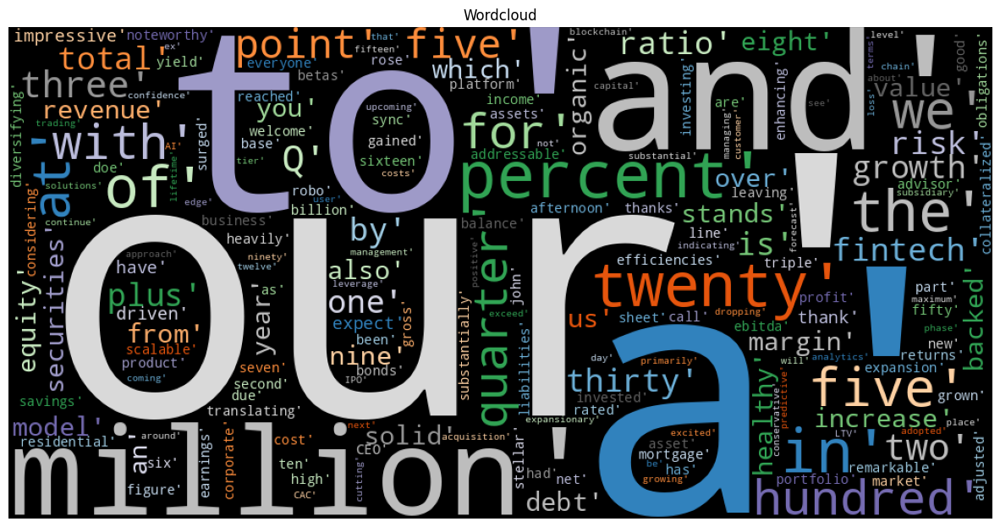

In [27]:
word_list = [item['Word'] for item in words]
wordcloud = WordCloud(width=1024,
                      height=512,
                      background_color='black',
                      colormap='tab20c').generate(str(word_list))

plt.figure(figsize=(15, 8))
plt.imshow(wordcloud)
plt.axis("off")

plt.title("Wordcloud")
plt.savefig("wordcloud.png")
plt.show()

## 4. Azure Open AI on the audio file transcript

In [28]:
model = "text-davinci-003"

In [29]:
def azure_openai(prompt, temperature=0.8):
    """
    Get Azure Open AI results
    """
    results = openai.Completion.create(
        engine=model,
        prompt=prompt,
        temperature=temperature,
        max_tokens=800,
    )

    answer = results["choices"][0]["text"].strip("\n")
    
    return answer

## Introduction

In [30]:
local_tz = pytz.timezone(requests.get("https://ipinfo.io").json()['timezone'])
now = datetime.now(local_tz).strftime('%d-%b-%Y %H:%M:%S')
intro = "My meeting notes processed by Azure Open AI and Azure Speech services. Date: " + str(now)

print("\033[1;31;34m", intro)

 My meeting notes processed by Azure Open AI and Azure Speech services. Date: 11-Sep-2023 15:26:33


### Summary of transcript vocal meeting notes

In [31]:
summary_prompt = "You are a highly skilled AI trained in language comprehension and summarization.\
 I would like you to read the following text and summarize it into a concise abstract paragraph.\
 Aim to retain the most important points, providing a coherent and readable summary that could\
 help a person understand the main points of the discussion without needing to read the entire text.\
 Please avoid unnecessary details or tangential points. This is the text:" + str(transcript)

In [32]:
summary = azure_openai(summary_prompt, 0.8)

print("\033[1;31;34m", summary)

 Fintech Plus Sync had a successful Q2 with a revenue of 125 million, a 25% increase year over year, and a gross profit margin of 58%. Their net income rose to 16 million, total assets reached 1.5 billion, and their debt to equity ratio stood at 1.5. They saw organic user growth and had a LTV CAC ratio of 3.5%. They have a value at risk model in place and are expecting a 8% quarter over quarter revenue growth in the next quarter, driven by blockchain and AI. Additionally, they are excited about their subsidiary's upcoming IPO, which is expected to raise 200 million.


## People and organization

In [33]:
people_prompt = "You are a highly skilled AI trained in language comprehension and identification of people and organizations.\
 Just display the people names and organizations. This is the text:" + str(transcript)

In [34]:
people = azure_openai(people_prompt, 0)

print("\033[1;31;34m", people)

 People Names:
John Doe 

Organizations:
Fintech Plus 
Pay Plus


## Classification

In [35]:
classif_prompt = "You are a highly skilled AI trained in language comprehension and \
classification of text. Classify this text into ['Travel', 'Sports', 'Finance', 'Customer meeting', 'Marketing event']"\
+ str(transcript)

In [36]:
classification = azure_openai(classif_prompt, 0)

print("\033[1;31;34m", classification)

 Finance


### Key Information of transcript vocal meeting notes

In [37]:
keypoints_prompt = "You are a proficient AI with a specialty in distilling information into key points.\
 Based on the following text, identify and list the main points that were discussed or brought up.\
 These should be the most important ideas, findings, or topics that are crucial to the essence of\
 the discussion. Your goal is to provide a list that someone could read to quickly understand\
 what was talked about." + str(transcript)

In [38]:
keypoints = azure_openai(keypoints_prompt, 0.8)

print("\033[1;31;34m", keypoints)

 Main Points: 
1. Q2 2023 revenue of 125 million, a 25% increase year over year.
2. Gross profit margin of 58%, with a 30% EBITDA margin
3. Net income for the quarter rose to 16 million, up from 10 million the previous year
4. Investing in asset-backed securities and corporate bonds 
5. Total assets of 1.5 billion, total liabilities of 900 million, and equity base of 600 million 
6. Debt to equity ratio of 1.5, a healthy figure 
7. Organic user growth with customer acquisition cost dropping by 15% and lifetime value growing by 25% 
8. LTV CAC ratio of 3.5% 
9. Risk management with a 99% confidence level and a maximum loss of 5 million
10. Forecast of 8% quarter over quarter growth in Q3 driven by blockchain and AI 
11. Upcoming IPO of Fintech subsidiary Pay Plus, expected to raise 200 million 
12. Continued faith from shareholders


### Actions list of transcript vocal meeting notes

In [39]:
action_prompt = "You are an AI expert in analyzing conversations and extracting action items.\
 Please review the text and identify any tasks, assignments, or actions that were agreed\
 upon or mentioned as needing to be done. These could be tasks assigned to specific individuals,\
 or general actions that the group has decided to take. Please list these action items\
 clearly and concisely." + str(transcript)

In [40]:
actions = azure_openai(action_prompt, 0.7)

print("\033[1;31;34m", actions)

 Action Items: 
1. Diversify asset backed securities portfolio 
2. Invest 25 million in AAA rated corporate bonds 
3. Expand high yield savings product line 
4. Launch Robo advisor platform
5. Adopt a conservative approach to managing leverage 
6. Invest in collateralized debt obligations and residential mortgage-backed securities 
7. Implement value at risk model with 99% confidence level 
8. Launch blockchain chain solutions and AI driven predictive analytics 
9. Prepare for Pay Plus IPO 
10. Set aggressive growth strategies for Q3


### Sentiment analysis of transcript vocal meeting notes

In [41]:
sentiment_prompt = "As an AI with expertise in language and emotion analysis, your task is to analyze the sentiment\
 of the following text. Please consider the overall tone of the discussion, the emotion conveyed by the language\
 used, and the context in which words and phrases are used. Indicate whether the sentiment is generally positive,\
 negative, or neutral, and provide brief explanations for your analysis where possible." + str(transcript)

In [42]:
sentiment = azure_openai(sentiment_prompt, 0.7)

print("\033[1;31;34m", sentiment)

 The sentiment of this text is generally positive. The text indicates strong financial performance for the company, including high revenue, gross profit margins, net income, and addressable market growth. The company is also diversifying its asset-backed securities portfolio, investing in high-rated corporate bonds, and growing customer acquisition cost and lifetime value. The overall tone of the text conveys confidence in the company's success and a positive outlook for the future.


## 5. Exporting all the Azure Open AI results into a .docx document

In [43]:
docx_file = "meeting_notes_from_audio.docx"

In [44]:
docx_content = f"{intro}\n\nClassification: {classification}\n\n{people}\n\nSummary:\n{summary}\n\n{keypoints}\n\n{actions}\n\n{sentiment}"

print("\033[1;31;34mContent to save into a .docx document:\n\n", docx_content)

Content to save into a .docx document:

 My meeting notes processed by Azure Open AI and Azure Speech services. Date: 11-Sep-2023 15:26:33

Classification: Finance

People Names:
John Doe 

Organizations:
Fintech Plus 
Pay Plus

Summary:
Fintech Plus Sync had a successful Q2 with a revenue of 125 million, a 25% increase year over year, and a gross profit margin of 58%. Their net income rose to 16 million, total assets reached 1.5 billion, and their debt to equity ratio stood at 1.5. They saw organic user growth and had a LTV CAC ratio of 3.5%. They have a value at risk model in place and are expecting a 8% quarter over quarter revenue growth in the next quarter, driven by blockchain and AI. Additionally, they are excited about their subsidiary's upcoming IPO, which is expected to raise 200 million.

Main Points: 
1. Q2 2023 revenue of 125 million, a 25% increase year over year.
2. Gross profit margin of 58%, with a 30% EBITDA margin
3. Net income for the quarter rose to 16 million, up 

In [45]:
print("Creating the Word document...")
doc = Document()
doc.add_paragraph(docx_content)
doc.save(docx_file)
print("Done")

Creating the Word document...
Done


In [46]:
!ls $docx_file -lh

-rwxrwxrwx 1 root root 37K Sep 11 13:26 meeting_notes_from_audio.docx


In [47]:
from IPython.display import FileLink

doclink = FileLink(path=docx_file)
doclink

/mnt/batch/tasks/shared/LS_root/mounts/clusters/standardd14sr/code/Users/seretkow/Meeting notes Speech to text/meeting_notes_from_audio.docx

## 6. Azure text to speech on the Azure Open AI results

In [48]:
text_file = "meeting_notes_from_audio.txt"
wav_file = "meeting_notes_results_from_azure_openai.wav"

In [49]:
# Saving the docx_content into a text file
with open(text_file, "w") as file:
    file.write(docx_content)

In [50]:
def azure_text_to_speech():
    """
    Text to speech in English with Azure Speech services to read the answer
    """
    path = '/translate?api-version=3.0'
        
    speech_config = speechsdk.SpeechConfig(
        subscription=azure_speech_key,
        region=azure_service_region
    )
    
    # Available Microsoft neural voices
    # https://learn.microsoft.com/en-us/azure/cognitive-services/speech-service/language-support?tabs=tts
    #
    # Check voice gallery: https://speech.microsoft.com/portal/voicegallery

    voice_list_en = [
        "en-US-AmberNeural",
        "en-US-AnaNeural",
        "en-US-AriaNeural",
        "en-US-AshleyNeural",
        "en-US-BrandonNeural",
        "en-US-ChristopherNeural",
        "en-US-CoraNeural",
        "en-US-DavisNeural",
        "en-US-ElizabethNeural",
        "en-US-EricNeural",
        "en-US-GuyNeural",
        "en-US-JacobNeural",
        "en-US-JaneNeural",
        "en-US-JasonNeural",
        "en-US-JennyNeural",
        "en-US-MichelleNeural",
        "en-US-MonicaNeural",
        "en-US-NancyNeural",
        "en-US-RogerNeural1",
        "en-US-SaraNeural",
        "en-US-SteffanNeural",
        "en-US-TonyNeural",
        "en-GB-AbbiNeural",
        "en-GB-AlfieNeural",
        "en-GB-BellaNeural",
        "en-GB-ElliotNeural",
        "en-GB-EthanNeural",
        "en-GB-HollieNeural",
        "en-GB-LibbyNeural",
        "en-GB-MaisieNeural",
        "en-GB-NoahNeural",
        "en-GB-OliverNeural",
        "en-GB-OliviaNeural",
        "en-GB-RyanNeural",
        "en-GB-SoniaNeural"
        "en-GB-ThomasNeural"
    ]
    
    # Let's choose a random voice from the list
    voice = voice_list_en[random.randint(0, len(voice_list_en) - 1)]
    
    print("Generating the audio file from text using voice:", voice)
    # Speech Config
    speech_config.speech_synthesis_voice_name = voice
    
    # Text to Speech
    audio_output = AudioOutputConfig(filename=wav_file)
    synthesizer = SpeechSynthesizer(speech_config=speech_config,
                                    audio_config=audio_output)

    # Reading the text
    with open(text_file, "r") as file:
        text_to_read = file.read()
    
    # Result
    result = synthesizer.speak_text_async(text_to_read).get()
    
    print("Done\n")
    print("File saved:")
    !ls $wav_file -lh
    
    return wav_file

In [51]:
start = time.time()

output_file = azure_text_to_speech()

elapsed = time.time() - start
print("Elapsed time: " + time.strftime("%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)))

Generating the audio file from text using voice: en-US-ElizabethNeural
Done

File saved:
-rwxrwxrwx 1 root root 6.9M Sep 11 13:26 meeting_notes_results_from_azure_openai.wav
Elapsed time: 00:00:03.035012


In [52]:
Audio(output_file, autoplay=False)

In [53]:
audiolink = FileLink(path=output_file)
audiolink

/mnt/batch/tasks/shared/LS_root/mounts/clusters/standardd14sr/code/Users/seretkow/Meeting notes Speech to text/meeting_notes_results_from_azure_openai.wav

In [54]:
get_audio_duration(output_file)

Duration of meeting_notes_results_from_azure_openai.wav = 3 minute(s) and 43.86 seconds


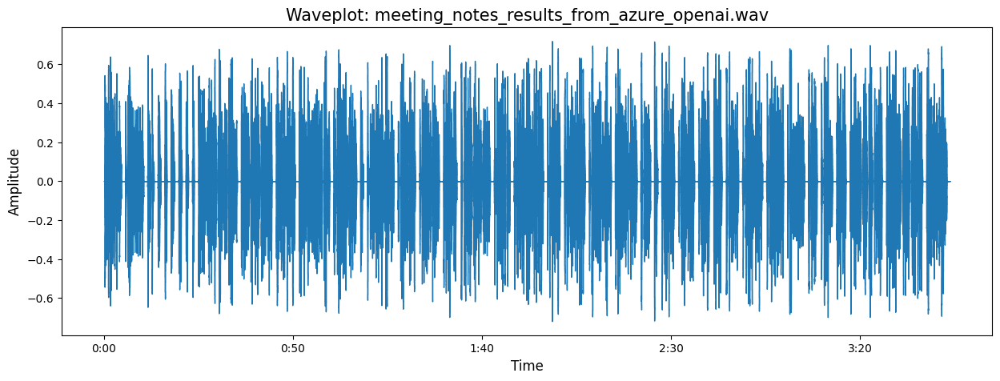

In [55]:
display_amplitude(output_file)

> end of notebook